In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import statsmodels

In [2]:
''''First we will work with customer_demographic and customer_address table because they can be used to draw the important 
attributes from data and then we will build RFM model which is used in many business problem with help of transaction dataset.''' 

"'First we will work with customer_demographic and customer_address table because they can be used to draw the important \nattributes from data and then we will build RFM model which is used in many business problem with help of transaction dataset."

In [3]:
#reading excel files
df_customerdemographic = pd.read_excel ('updated.xlsx','CustomerDemographicnew')#Customer_demographic
df_customeraddress=pd.read_excel('updated.xlsx','CustomerAddressnew')#Customer_address


In [4]:
#reading transaction file
df_transaction=pd.read_excel('updated.xlsx','transactionsnew')

In [5]:
#for viewing top 5 rows of dataset
df_customerdemographic.head()

,customer_id,name,gender,past_3_years_bike_related_purchases,DOB,age,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure
0,144,Jory Barrabeale,Male,71,1978-01-30,42,Environmental Tech,IT,Mass Customer,N,No,11
1,168,Reggie Broggetti,Female,8,1978-01-30,42,General Manager,IT,Affluent Customer,N,Yes,11
2,290,Giorgio Kevane,Male,42,1978-01-30,42,Senior Sales Associate,IT,Mass Customer,N,No,11
3,451,Marlow Flowerdew,Male,37,1978-01-30,42,Quality Control Specialist,IT,High Net Worth,N,No,11
4,453,Cornelius Yarmouth,Male,81,1978-01-30,42,Assistant Professor,IT,High Net Worth,N,No,11


In [6]:
df_customeraddress.head()

,customer_id,address,postcode,state,country,property_valuation,name,gender
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine Medendorp,Female
1,2,6 Meadow Vale Court,2153,New South Wales,Australia,10,Eli Bockman,Male
2,4,0 Holy Cross Court,4211,QLD,Australia,9,Talbot,Male
3,5,17979 Del Mar Point,2448,New South Wales,Australia,4,Sheila-kathryn Calton,Female
4,6,9 Oakridge Court,3216,Victoria,Australia,9,Curr Duckhouse,Male


In [7]:
df_transaction.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,17.87,41245,Kristos Anthony,Male
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,1702.55,41701,Lauree O'Donnell,Female
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,1544.61,36361,Berne Donegan,Male
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,817.36,36145,Titus Worsall,Male
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,1055.82,42226,Norma Batrim,Female


In [8]:
#merging the two dataset via column customer_id.
#We are merging the dataset df_customerdemographic,df_customeraddress for better analyzation.
df=pd.merge(df_customerdemographic,df_customeraddress, how="left", on=["customer_id","name","gender"])

In [9]:
df.head()

,customer_id,name,gender,past_3_years_bike_related_purchases,DOB,age,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation
0,144,Jory Barrabeale,Male,71,1978-01-30,42,Environmental Tech,IT,Mass Customer,N,No,11,22 Oxford Junction,2315.0,New South Wales,Australia,3.0
1,168,Reggie Broggetti,Female,8,1978-01-30,42,General Manager,IT,Affluent Customer,N,Yes,11,16 Golf View Center,3020.0,Victoria,Australia,6.0
2,290,Giorgio Kevane,Male,42,1978-01-30,42,Senior Sales Associate,IT,Mass Customer,N,No,11,6923 Tennessee Circle,2766.0,New South Wales,Australia,9.0
3,451,Marlow Flowerdew,Male,37,1978-01-30,42,Quality Control Specialist,IT,High Net Worth,N,No,11,8385 Lien Drive,3192.0,Victoria,Australia,10.0
4,453,Cornelius Yarmouth,Male,81,1978-01-30,42,Assistant Professor,IT,High Net Worth,N,No,11,37093 Manitowish Center,2170.0,New South Wales,Australia,10.0


In [10]:
df.columns

Index(['customer_id', 'name', 'gender', 'past_3_years_bike_related_purchases',
       'DOB', 'age', 'job_title', 'job_industry_category', 'wealth_segment',
       'deceased_indicator', 'owns_car', 'tenure', 'address', 'postcode',
       'state', 'country', 'property_valuation'],
      dtype='object')

In [11]:
df_transaction.columns

Index(['transaction_id', 'product_id', 'customer_id', 'transaction_date',
       'online_order', 'order_status', 'brand', 'product_line',
       'product_class', 'product_size', 'list_price', 'standard_cost',
       'profit', 'product_first_sold_date', 'name', 'gender'],
      dtype='object')

In [12]:
#describe gives all the necessary imformation about the dataset columns like columns values average,freqency
#include='all' is used for including categorical data. 
df.describe(include='all')

,customer_id,name,gender,past_3_years_bike_related_purchases,DOB,age,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,address,postcode,state,country,property_valuation
count,3988.000000,3988,3988,3988.000000,3988,3988.000000,3491,3332,3988,3988,3988,3988.000000,3984,3984.000000,3984,3984,3984.000000
unique,NaN,3986,2,NaN,3445,NaN,195,9,3,1,2,NaN,3981,NaN,3,1,NaN
top,NaN,Corabelle,Female,NaN,1978-01-30 00:00:00,NaN,Business Systems Development Analyst,Manufacturing,Mass Customer,N,Yes,NaN,64 Macpherson Junction,NaN,New South Wales,Australia,NaN
freq,NaN,2,2074,NaN,85,NaN,45,799,1998,3988,2016,NaN,2,NaN,2131,3984,NaN
first,NaN,NaN,NaN,NaN,1931-10-23 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2002-03-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2000.777583,NaN,NaN,48.850301,NaN,42.354313,NaN,NaN,NaN,NaN,NaN,10.662989,NaN,2986.307982,NaN,NaN,7.512299
std,1153.608336,NaN,NaN,28.722982,NaN,12.498652,NaN,NaN,NaN,NaN,NaN,5.604359,NaN,845.265202,NaN,NaN,2.825825
min,1.000000,NaN,NaN,0.000000,NaN,18.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,2000.000000,NaN,NaN,1.000000
25%,1003.750000,NaN,NaN,24.000000,NaN,33.000000,NaN,NaN,NaN,NaN,NaN,6.000000,NaN,2200.000000,NaN,NaN,6.000000


In [13]:
#deleted column name,Dob and job_title because there unique values is very large so they cannot be properly used in regression.
#job_title can be deleted and job_industry category can be used and same is with address
data=df.drop(['name','DOB','job_title',"address","deceased_indicator","country"],axis=1)

In [14]:
data.describe(include='all')
#here column job_industry_category has null values as its count is different from others.

,customer_id,gender,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,tenure,postcode,state,property_valuation
count,3988.000000,3988,3988.000000,3988.000000,3332,3988,3988,3988.000000,3984.000000,3984,3984.000000
unique,NaN,2,NaN,NaN,9,3,2,NaN,NaN,3,NaN
top,NaN,Female,NaN,NaN,Manufacturing,Mass Customer,Yes,NaN,NaN,New South Wales,NaN
freq,NaN,2074,NaN,NaN,799,1998,2016,NaN,NaN,2131,NaN
mean,2000.777583,NaN,48.850301,42.354313,NaN,NaN,NaN,10.662989,2986.307982,NaN,7.512299
std,1153.608336,NaN,28.722982,12.498652,NaN,NaN,NaN,5.604359,845.265202,NaN,2.825825
min,1.000000,NaN,0.000000,18.000000,NaN,NaN,NaN,1.000000,2000.000000,NaN,1.000000
25%,1003.750000,NaN,24.000000,33.000000,NaN,NaN,NaN,6.000000,2200.000000,NaN,6.000000
50%,2001.500000,NaN,48.000000,42.000000,NaN,NaN,NaN,11.000000,2768.000000,NaN,8.000000
75%,2999.250000,NaN,73.000000,52.000000,NaN,NaN,NaN,15.000000,3750.500000,NaN,10.000000


In [15]:
#To check for null values in any column
data.isna().sum()

customer_id                              0
gender                                   0
past_3_years_bike_related_purchases      0
age                                      0
job_industry_category                  656
wealth_segment                           0
owns_car                                 0
tenure                                   0
postcode                                 4
state                                    4
property_valuation                       4
dtype: int64

In [16]:
df.isnull().sum()

customer_id                              0
name                                     0
gender                                   0
past_3_years_bike_related_purchases      0
DOB                                      0
age                                      0
job_title                              497
job_industry_category                  656
wealth_segment                           0
deceased_indicator                       0
owns_car                                 0
tenure                                   0
address                                  4
postcode                                 4
state                                    4
country                                  4
property_valuation                       4
dtype: int64

In [17]:
#dropping all values from all columns
data1=data.dropna(axis=0)

In [18]:
data1.describe(include='all')

,customer_id,gender,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,tenure,postcode,state,property_valuation
count,3329.000000,3329,3329.000000,3329.000000,3329,3329,3329,3329.000000,3329.000000,3329,3329.000000
unique,NaN,2,NaN,NaN,9,3,2,NaN,NaN,3,NaN
top,NaN,Female,NaN,NaN,Manufacturing,Mass Customer,Yes,NaN,NaN,New South Wales,NaN
freq,NaN,1723,NaN,NaN,799,1677,1699,NaN,NaN,1783,NaN
mean,1989.141484,NaN,48.801442,42.219585,NaN,NaN,NaN,10.724242,2983.186843,NaN,7.483028
std,1153.081173,NaN,28.709994,12.460086,NaN,NaN,NaN,5.620748,842.834690,NaN,2.847765
min,1.000000,NaN,0.000000,18.000000,NaN,NaN,NaN,1.000000,2000.000000,NaN,1.000000
25%,989.000000,NaN,24.000000,33.000000,NaN,NaN,NaN,6.000000,2199.000000,NaN,6.000000
50%,1984.000000,NaN,48.000000,42.000000,NaN,NaN,NaN,11.000000,2768.000000,NaN,8.000000
75%,2989.000000,NaN,73.000000,51.000000,NaN,NaN,NaN,15.000000,3677.000000,NaN,10.000000


In [19]:
#Now we will find outliers and remove them by showing there PDF(probability distribution function).
#Now we will create probababilty distribution frequency for every numerical column and it should be normal distribution(the normal distribution is not necessary
#but it is better to used it in regression analysis.)

D:\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


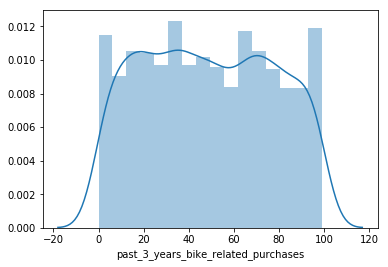

In [20]:
#past_3_years_bike_related_purchases
sns.distplot(data1["past_3_years_bike_related_purchases"])

D:\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


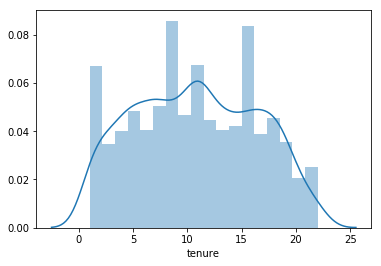

In [21]:
sns.distplot(data1["tenure"])

D:\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


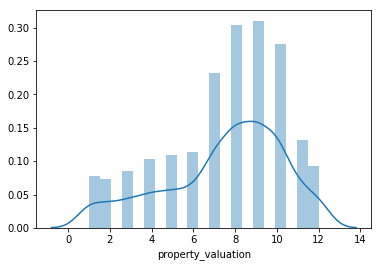

In [22]:
sns.distplot(data1["property_valuation"])
#property_valuation is left skewed so converting it into normal distribution

In [23]:
#quantile is used to take the prcententile of top 99% and get the single value ann then get all values below that.
q=data1['property_valuation'].quantile(0.1)
data11=data1[data1["age"]>q]

D:\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


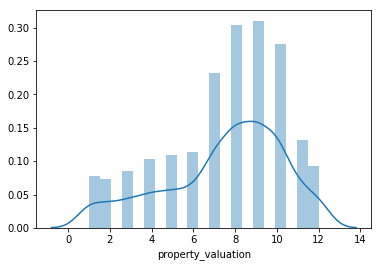

In [24]:
sns.distplot(data11["property_valuation"])
#Its better than previous curve.

In [31]:
#quantile is used to take the prcententiel of top 99% and then we have taken all below them
q=data11['age'].quantile(0.99)
data2=data11[data11["age"]<q]

D:\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


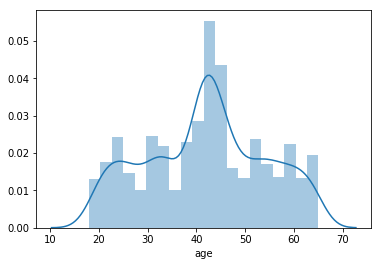

In [32]:
sns.distplot(data2["age"])

In [33]:
data2.head()

,customer_id,gender,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,tenure,postcode,state,property_valuation
0,144,Male,71,42,IT,Mass Customer,No,11,2315.0,New South Wales,3.0
1,168,Female,8,42,IT,Affluent Customer,Yes,11,3020.0,Victoria,6.0
2,290,Male,42,42,IT,Mass Customer,No,11,2766.0,New South Wales,9.0
3,451,Male,37,42,IT,High Net Worth,No,11,3192.0,Victoria,10.0
4,453,Male,81,42,IT,High Net Worth,No,11,2170.0,New South Wales,10.0


In [34]:
data2.describe(include='all')

,customer_id,gender,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,tenure,postcode,state,property_valuation
count,3288.000000,3288,3288.000000,3288.000000,3288,3288,3288,3288.000000,3288.000000,3288,3288.000000
unique,NaN,2,NaN,NaN,9,3,2,NaN,NaN,3,NaN
top,NaN,Female,NaN,NaN,Manufacturing,Mass Customer,Yes,NaN,NaN,New South Wales,NaN
freq,NaN,1695,NaN,NaN,787,1654,1682,NaN,NaN,1763,NaN
mean,1991.520985,NaN,48.811131,41.900852,NaN,NaN,NaN,10.715328,2983.954075,NaN,7.485706
std,1152.736319,NaN,28.651148,12.191002,NaN,NaN,NaN,5.629942,842.441131,NaN,2.847366
min,2.000000,NaN,0.000000,18.000000,NaN,NaN,NaN,1.000000,2000.000000,NaN,1.000000
25%,992.750000,NaN,24.000000,33.000000,NaN,NaN,NaN,6.000000,2200.000000,NaN,6.000000
50%,1986.500000,NaN,48.000000,42.000000,NaN,NaN,NaN,11.000000,2768.000000,NaN,8.000000
75%,2992.250000,NaN,73.000000,51.000000,NaN,NaN,NaN,15.000000,3680.250000,NaN,10.000000


In [35]:
data2.columns

Index(['customer_id', 'gender', 'past_3_years_bike_related_purchases', 'age',
       'job_industry_category', 'wealth_segment', 'owns_car', 'tenure',
       'postcode', 'state', 'property_valuation'],
      dtype='object')

In [36]:
#EXPLORATORY DATA ANALYSIS

In [39]:
#finding correlation between different numerical variables in our dataset. 
corr=data2.corr()

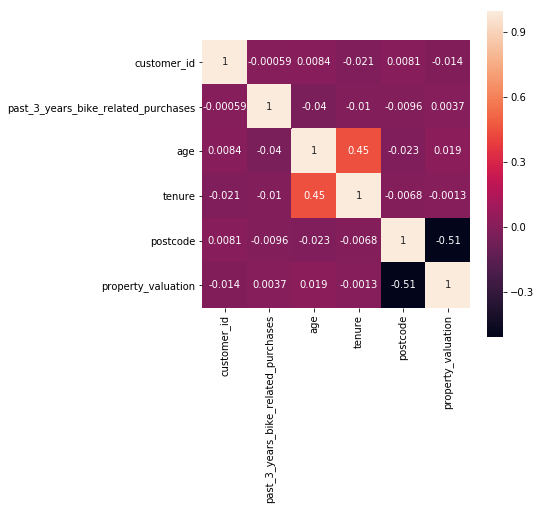

In [40]:
f,ax=plt.subplots(figsize=(6,6))

sns.heatmap(corr,square=True,annot=True)
#from heatmap we can see age is highly dependent on tenure.more is the age more is the tenure(tenure is not correlated to bikes sales and to deal with multicollinearity we will remove it.)
#there exist the negative correlation between postcode and prperty_valuation(we will use this in the the analysis and will remove the property_valuation column)
#there is no correlation between past_3_years and other numeric variables. 


In [41]:
#this tells about multcollinearity between different independent variables
#if VIF is greater than 10 then we must deal with it
#if its more than 5 than we can see according to their importance on our dependent variable(in our case bike_purchase)
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables=data2[['age','tenure','property_valuation']]
vif=pd.DataFrame()
vif["VIF"]=[variance_inflation_factor(variables.values,i) for i in range(variables.shape[1])]
vif["features"]=variables.columns

In [42]:
vif
#from this we came to know that age is highly dependant on tenure and tenure on property_valuation so we will deal with it
#afterwards.

,VIF,features
0,9.491852,age
1,5.744966,tenure
2,5.250217,property_valuation


D:\anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead
  


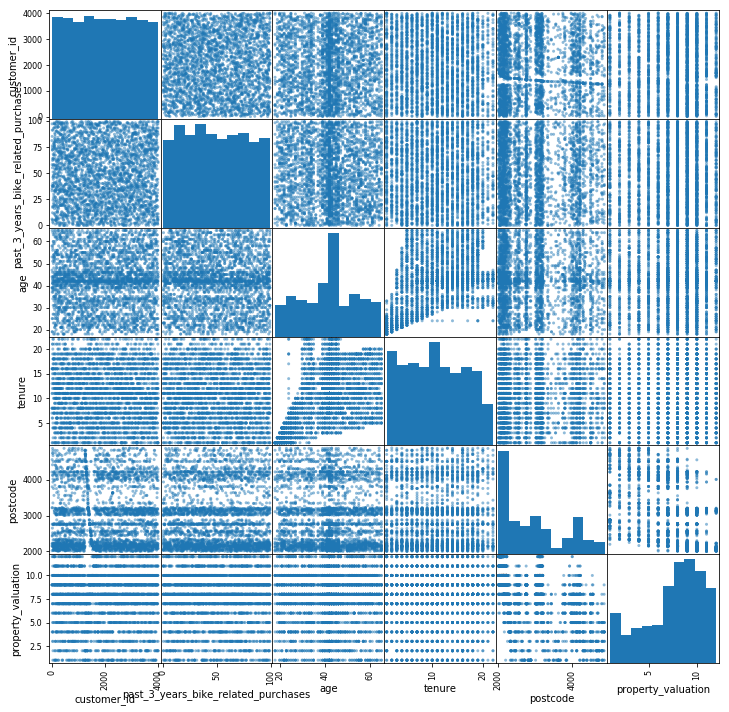

In [43]:
#Scatter_matrix provides scatter plot between all variables.
pd.scatter_matrix(data2, figsize=(12, 12))
plt.show()
#age is dependent on tenure
#there exists discrete values for property_valuation and tenure. 



In [46]:
#making pairplots(pairplots are used to provide the relationship between three attributes in dataset.)
cols=data2.columns.values
cols

array(['customer_id', 'gender', 'past_3_years_bike_related_purchases',
       'age', 'job_industry_category', 'wealth_segment', 'owns_car',
       'tenure', 'postcode', 'state', 'property_valuation'], dtype=object)

In [47]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3288 entries, 0 to 3986
Data columns (total 11 columns):
customer_id                            3288 non-null int64
gender                                 3288 non-null object
past_3_years_bike_related_purchases    3288 non-null int64
age                                    3288 non-null int64
job_industry_category                  3288 non-null object
wealth_segment                         3288 non-null object
owns_car                               3288 non-null object
tenure                                 3288 non-null int64
postcode                               3288 non-null float64
state                                  3288 non-null object
property_valuation                     3288 non-null float64
dtypes: float64(2), int64(4), object(5)
memory usage: 308.2+ KB


<Figure size 432x288 with 0 Axes>

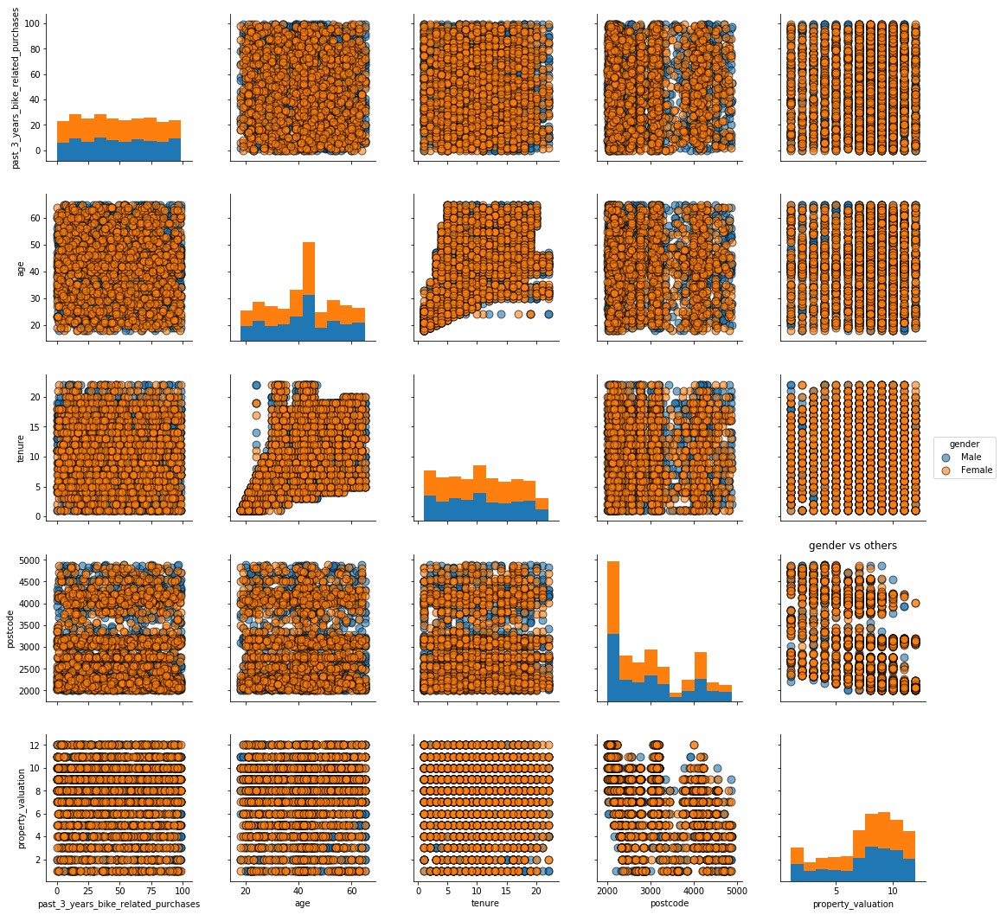

In [49]:

cat_cols=['gender','job_industry_category', 'wealth_segment', 'owns_car','state']

cols=['gender', 'past_3_years_bike_related_purchases',
       'age', 'job_industry_category', 'wealth_segment', 'owns_car',
       'tenure', 'postcode', 'state', 'property_valuation']
plt.figure()
sns.pairplot(data2[cols],size=3,hue=cat_cols[0],plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
plt.title("gender vs others")
plt.show()

#this graph does not give much information about data as we can see the man and women participation is distributed throughout the factors

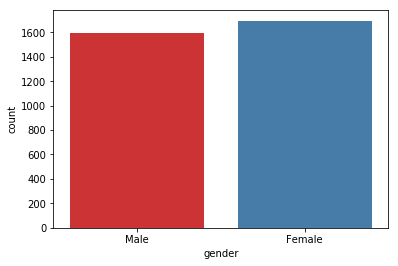

In [50]:
sns.countplot(data2["gender"],palette='Set1')
#Females are more in compare to males.

In [54]:
#calculating the ratio of  sum of bikes purchased in 3 years by each gender to the count of gender.
data_gender=[0,0]
data2_gender_count=data2["gender"].value_counts()

data_gender[0]=df["past_3_years_bike_related_purchases"][df["gender"]=="Female"].sum()
data_gender[1]=df["past_3_years_bike_related_purchases"][df["gender"]=="Male"].sum()
print("sum of bikes purchased in 3 years by each gender:female,male")
print(data_gender)

perc_gender=pd.DataFrame()

perc_gender["index"]=["Female","Male"]

perc_gender["Ratio of bike purchase"]=[(i/j) for i,j in zip(data_gender,data2_gender_count)]
perc_gender



sum of bikes purchased in 3 years by each gender:female,male
[99539, 95276]


,index,Ratio of bike purchase
0,Female,58.725074
1,Male,59.809165


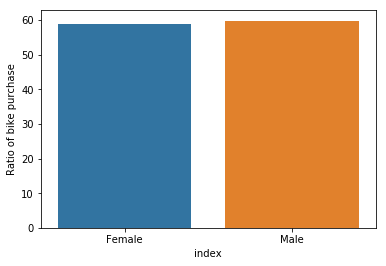

In [56]:

fig_dims = (6, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="index",y="Ratio of bike purchase",ax=ax,data=perc_gender)

<Figure size 432x288 with 0 Axes>

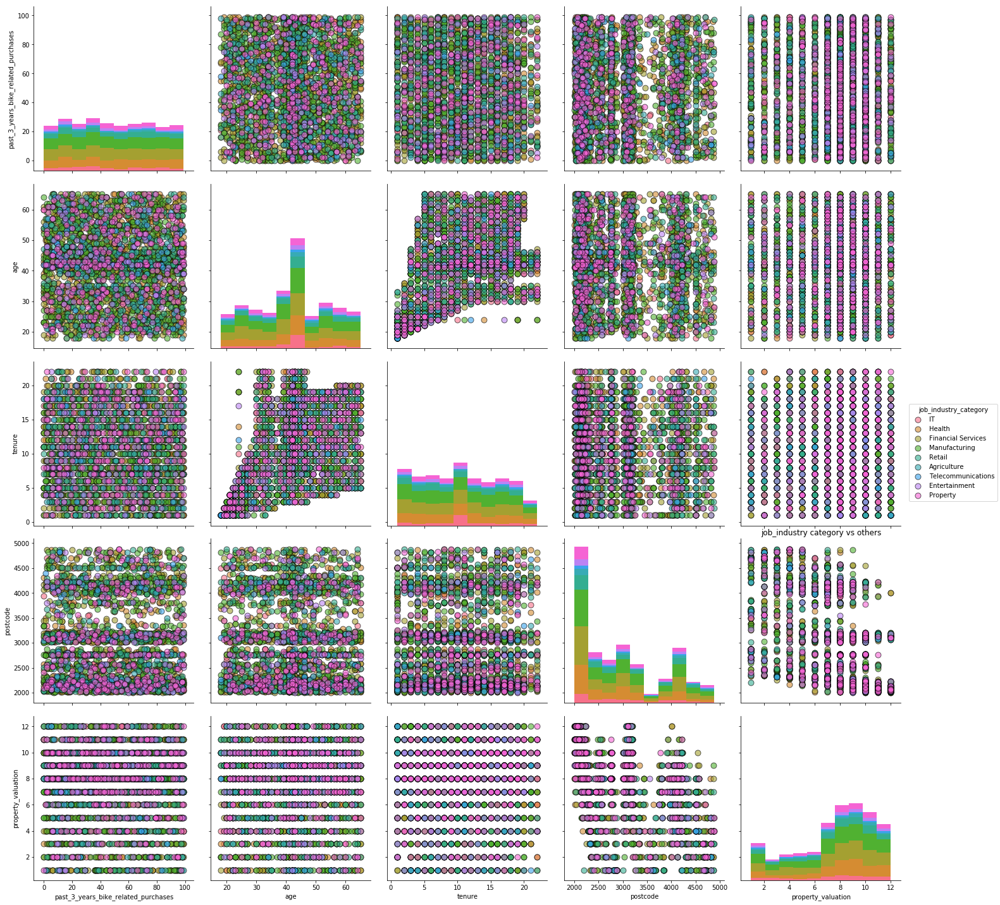

In [57]:
#Doing this for all categoical variables.
cat_cols=['gender','job_industry_category', 'wealth_segment', 'owns_car','state']

cols=[ 'gender', 'past_3_years_bike_related_purchases',
       'age', 'job_industry_category', 'wealth_segment', 'owns_car',
       'tenure', 'postcode', 'state', 'property_valuation']
plt.figure()
sns.pairplot(data2[cols],size=4,hue=cat_cols[1],palette="husl",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
plt.title("job_industry category vs others")
plt.show()

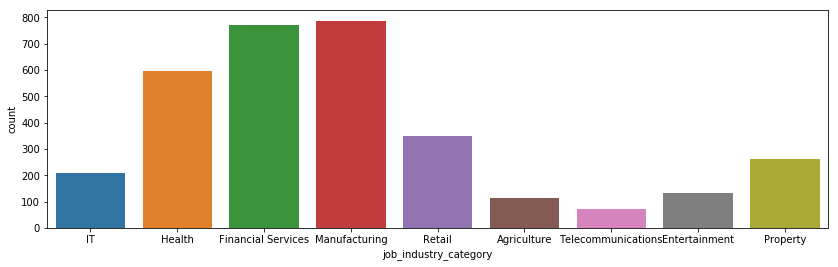

In [58]:

plt.figure(figsize=(14,4)) # this creates a figure 8 inch wide, 4 inch high
sns.countplot(x="job_industry_category", data=data2)
plt.show()

In [48]:
df["job_industry_category"].unique()

array(['IT', 'Health', 'Financial Services', 'Manufacturing', 'Property',
       nan, 'Retail', 'Agriculture', 'Telecommunications',
       'Entertainment'], dtype=object)

In [60]:

data_job_industry_category=[0,0,0,0,0,0,0,0,0]
data2_job_count=data2["job_industry_category"].value_counts()



data_job_industry_category[0]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Manufacturing'].sum()
data_job_industry_category[1]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Financial Services'].sum()
data_job_industry_category[2]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Health'].sum()
data_job_industry_category[3]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Retail'].sum()
data_job_industry_category[4]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Property'].sum()
data_job_industry_category[5]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='IT'].sum()
data_job_industry_category[6]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Entertainment'].sum()
data_job_industry_category[7]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Agriculture'].sum()
data_job_industry_category[8]=df["past_3_years_bike_related_purchases"][df["job_industry_category"]=='Telecommunications'].sum()
print("sum of bikes purchased in 3 years by each category:Manufacturing,Financial Services,Health,Retail,Property,IT,Entertainme,Agriculture,Telecommunications")
print(data_job_industry_category)


perc_job_industry_category=pd.DataFrame()
perc_job_industry_category["index"]=['Manufacturing', 'Financial Services','Health','Retail','Property','IT','Entertainment','Agriculture','Telecommunications']
perc_job_industry_category["ratio of sum of bikes purchased in 3 years by each category to the count of each category"]=[(i/j) for i,j in zip(data_job_industry_category,data2_job_count)]
perc_job_industry_category


sum of bikes purchased in 3 years by each category:Manufacturing,Financial Services,Health,Retail,Property,IT,Entertainme,Agriculture,Telecommunications
[39272, 37493, 29972, 17210, 13294, 9899, 6320, 5945, 3244]


,index,ratio of sum of bikes purchased in 3 years by each category to the count of each category
0,Manufacturing,49.900889
1,Financial Services,48.692208
2,Health,50.373109
3,Retail,49.454023
4,Property,50.740458
5,IT,47.591346
6,Entertainment,47.164179
7,Agriculture,53.080357
8,Telecommunications,45.055556


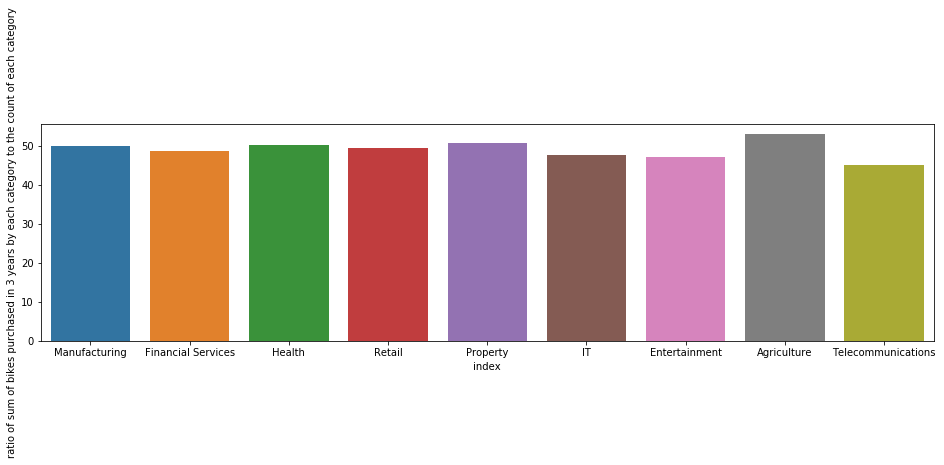

In [62]:
fig_dims = (16, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="index",y="ratio of sum of bikes purchased in 3 years by each category to the count of each category",ax=ax,data=perc_job_industry_category)
#SO THIS TELL US THAT THE CUSTOMERS FROM FINANCIAL AND MANUFACTURING ARE MORE IMPORTANT

<Figure size 432x288 with 0 Axes>

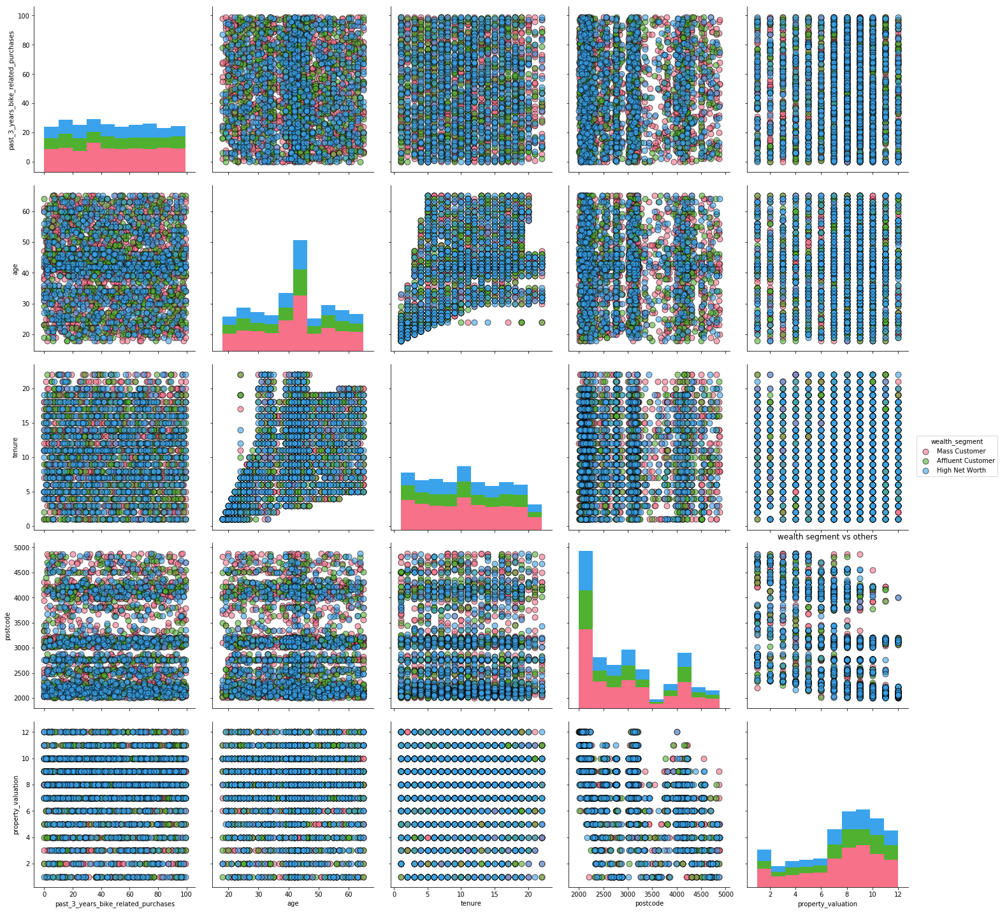

In [63]:
cat_cols=['gender','job_industry_category', 'wealth_segment', 'owns_car','state']

cols=[ 'gender', 'past_3_years_bike_related_purchases',
       'age', 'job_industry_category', 'wealth_segment', 'owns_car',
       'tenure', 'postcode', 'state', 'property_valuation']
plt.figure()
sns.pairplot(data2[cols],size=4,hue=cat_cols[2],palette="husl",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
plt.title("wealth segment vs others")
plt.show()

In [64]:
df["wealth_segment"].unique()

array(['Mass Customer', 'Affluent Customer', 'High Net Worth'],
      dtype=object)

In [65]:
data_wealth_segment=[0,0,0]
data_wealth_segment[0]=data2["past_3_years_bike_related_purchases"][data2["wealth_segment"]=='Mass Customer'].sum()
data_wealth_segment[1]=data2["past_3_years_bike_related_purchases"][data2["wealth_segment"]=='High Net Worth'].sum()
data_wealth_segment[2]=data2["past_3_years_bike_related_purchases"][data2["wealth_segment"]=='Affluent Customer'].sum()
print("sum of bikes purchased in 3 years by each category:Mass Customer,High Net Worth,Affluent Customer")
print(data_wealth_segment)


data2_wealth_count=data2["wealth_segment"].value_counts()

perc_wealth_segment=pd.DataFrame()
perc_wealth_segment["index"]=['Mass Customer', 'High Net Worth', 'Affluent Customer ']
perc_wealth_segment["Percentage"]=[(i/j) for i,j in zip(data_wealth_segment,data2_wealth_count)]
perc_wealth_segment


sum of bikes purchased in 3 years by each category:Mass Customer,High Net Worth,Affluent Customer
[81772, 39844, 38875]


,index,Percentage
0,Mass Customer,49.438936
1,High Net Worth,47.603345
2,Affluent Customer,48.776662


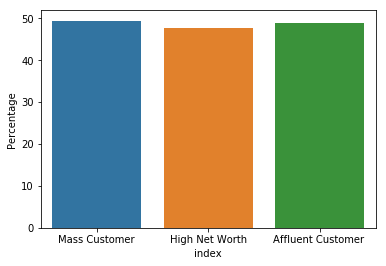

In [66]:
fig_dims = (6, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="index",y="Percentage",ax=ax,data=perc_wealth_segment)
#SO THIS TELL US THAT THE MASS CUSTOMERS ARE MORE IMPORTANT

<Figure size 432x288 with 0 Axes>

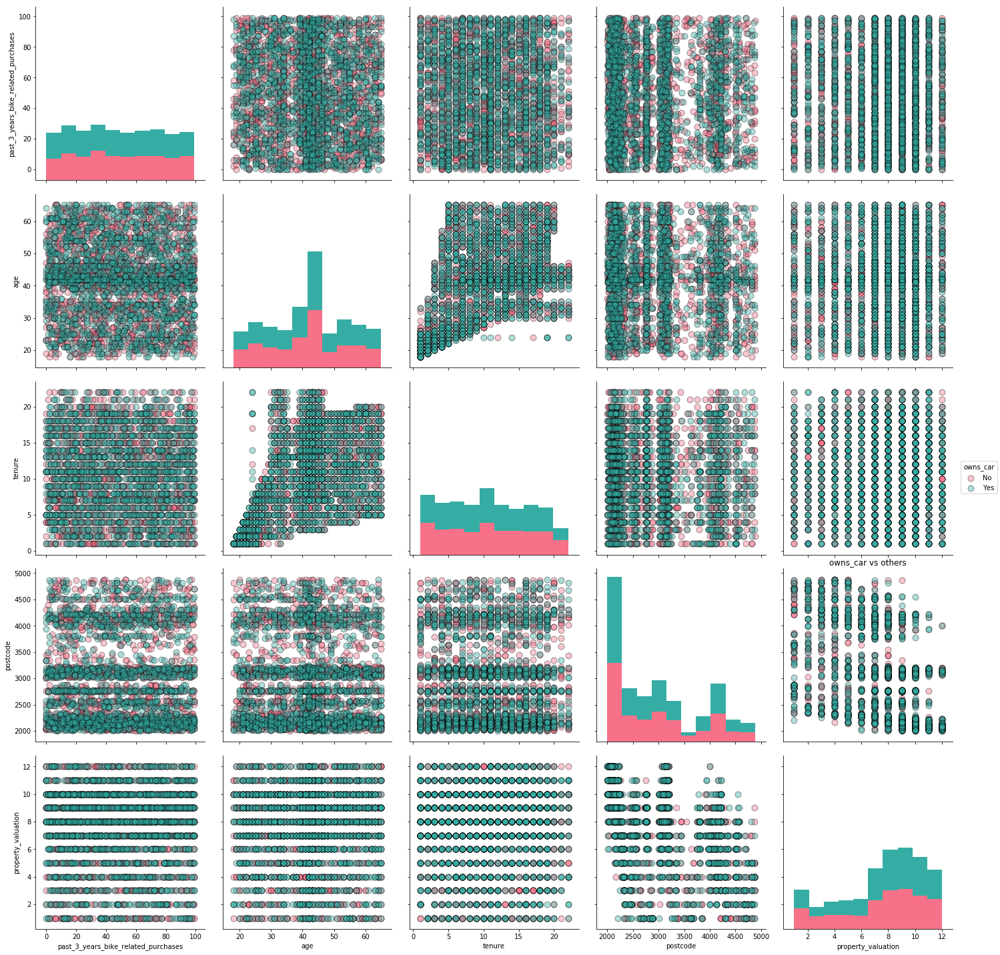

In [67]:
cat_cols=['gender','job_industry_category', 'wealth_segment', 'owns_car','state']

cols=[ 'gender', 'past_3_years_bike_related_purchases',
       'age', 'job_industry_category', 'wealth_segment', 'owns_car',
       'tenure', 'postcode', 'state', 'property_valuation']
plt.figure()
sns.pairplot(data2[cols],size=4,hue=cat_cols[3],palette="husl",plot_kws = {'alpha': 0.4, 's': 80, 'edgecolor': 'k'})
plt.title("owns_car vs others")
plt.show()

In [68]:
data_owns_car=[0,0]
data_owns_car[0]=df["past_3_years_bike_related_purchases"][df["owns_car"]=='Yes'].sum()
data_owns_car[1]=df["past_3_years_bike_related_purchases"][df["owns_car"]=='No'].sum()
print(data_owns_car)
data2_car_count=data2["owns_car"].value_counts()
print(data2_car_count)




perc_owns_car=pd.DataFrame()
perc_owns_car["index"]=['Yes','No']
perc_owns_car["Percentage"]=[(i/j) for i,j in zip(data_owns_car,data2_car_count)]
perc_owns_car

[97671, 97144]
Yes    1682
No     1606
Name: owns_car, dtype: int64


,index,Percentage
0,Yes,58.068371
1,No,60.488169


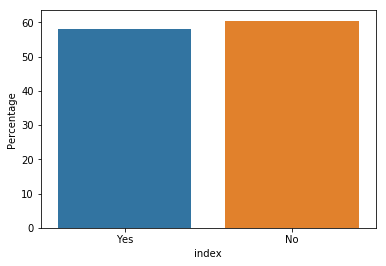

In [69]:
fig_dims = (6, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="index",y="Percentage",ax=ax,data=perc_owns_car)

<Figure size 432x288 with 0 Axes>

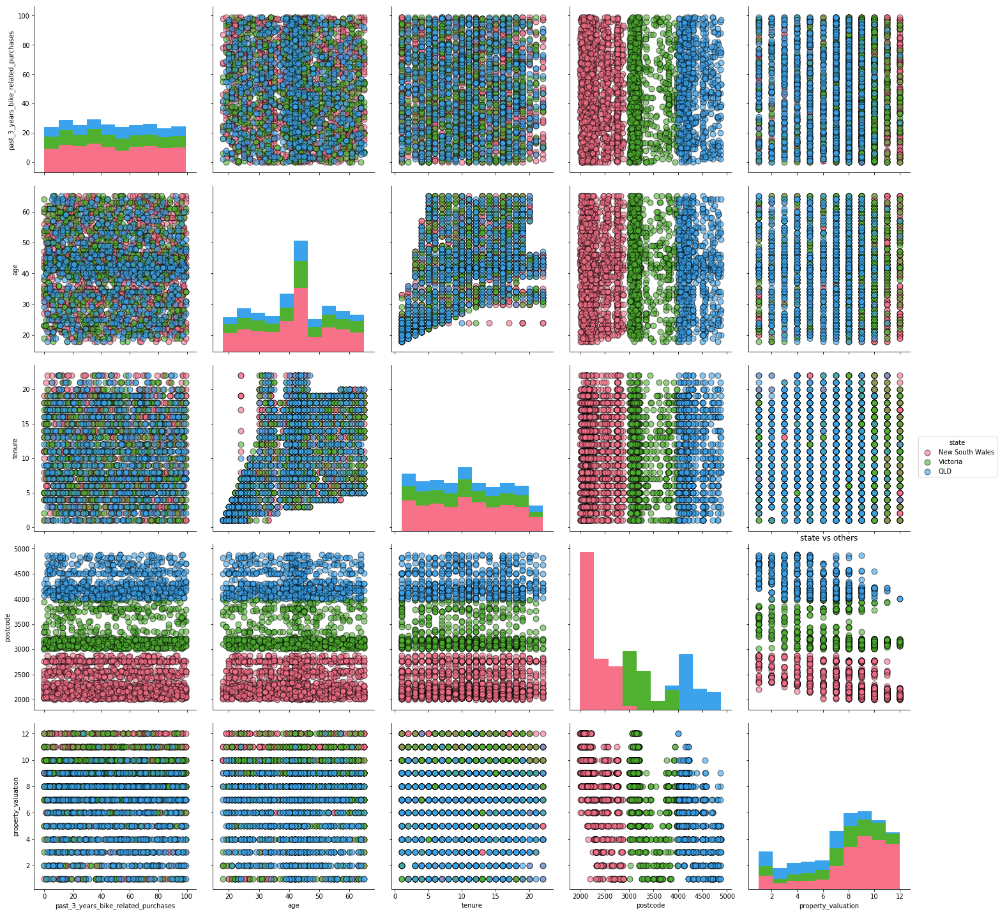

In [70]:
cat_cols=['gender','job_industry_category', 'wealth_segment', 'owns_car','state']

cols=[ 'gender', 'past_3_years_bike_related_purchases',
       'age', 'job_industry_category', 'wealth_segment', 'owns_car',
       'tenure', 'postcode', 'state', 'property_valuation']
plt.figure()
sns.pairplot(data2[cols],size=4,hue=cat_cols[4],palette="husl",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
plt.title("state vs others")
plt.show()
#here we have one important thing that we can have three different cluster for postcards.Sowe can define imfroamtion using states only so dropping the postal code.

In [71]:
data2=data2.drop("postcode",axis=1)

In [72]:
data2["state"].unique()

array(['New South Wales', 'Victoria', 'QLD'], dtype=object)

In [73]:
data_state=[0,0,0]
data_state[0]=df["past_3_years_bike_related_purchases"][df["state"]=='New South Wales'].sum()
data_state[1]=df["past_3_years_bike_related_purchases"][df["state"]=='Victoria'].sum()
data_state[2]=df["past_3_years_bike_related_purchases"][df["state"]=='QLD'].sum()
print(data_state)
data2_state_count=data2["state"].value_counts()
print(data2_state_count)




perc_state=pd.DataFrame()
perc_state["index"]=['New South Wales', 'Victoria', 'QLD']
perc_state["Percentage"]=[(i/j) for i,j in zip(data_state,data2_state_count)]
perc_state

[104302, 49154, 41127]
New South Wales    1763
Victoria            843
QLD                 682
Name: state, dtype: int64


,index,Percentage
0,New South Wales,59.161656
1,Victoria,58.308422
2,QLD,60.303519


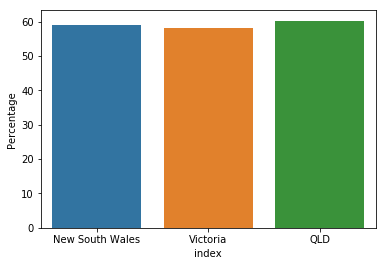

In [74]:
fig_dims = (6, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="index",y="Percentage",ax=ax,data=perc_state)
#we should focus on customer in QLD

In [75]:
data2.head()

,customer_id,gender,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation
0,144,Male,71,42,IT,Mass Customer,No,11,New South Wales,3.0
1,168,Female,8,42,IT,Affluent Customer,Yes,11,Victoria,6.0
2,290,Male,42,42,IT,Mass Customer,No,11,New South Wales,9.0
3,451,Male,37,42,IT,High Net Worth,No,11,Victoria,10.0
4,453,Male,81,42,IT,High Net Worth,No,11,New South Wales,10.0


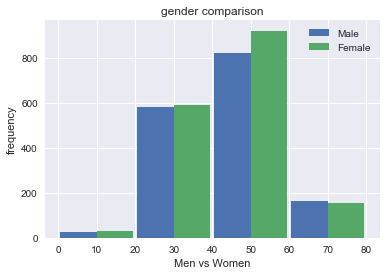

In [64]:
sns.set()
_=plt.hist([data2["age"][data2["gender"]=="Male"],data2["age"][data2["gender"]=="Female"]],bins=[0,20,40,60,80],rwidth=0.95,label=["Male","Female"])
plt.xlabel("Men vs Women")
plt.ylabel("frequency")
plt.title("gender comparison")
plt.legend()
plt.show()

In [65]:
data2["property_valuation"].describe()

count    3288.000000
mean        7.485706
std         2.847366
min         1.000000
25%         6.000000
50%         8.000000
75%        10.000000
max        12.000000
Name: property_valuation, dtype: float64

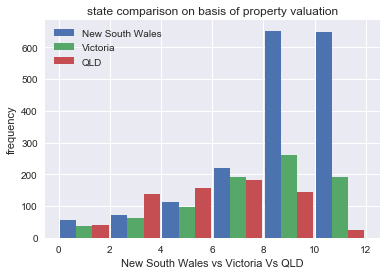

In [66]:
sns.set()
_=plt.hist([data2["property_valuation"][data2["state"]=="New South Wales"],data2["property_valuation"][data2["state"]=="Victoria"],data2["property_valuation"][data2["state"]=="QLD"]],bins=[0,2,4,6,8,10,12],rwidth=0.95,label=["New South Wales","Victoria","QLD"])
plt.xlabel("New South Wales vs Victoria Vs QLD")
plt.ylabel("frequency")
plt.title("state comparison on basis of property valuation")
plt.legend()
plt.show()
#this graph show us that property_valuation of customer in newsouthwales in higher than other states and most customer who purchase bikes belongs to this category
#so we will drop the column property_valuation as it is correlated with states.


In [67]:
data2["past_3_years_bike_related_purchases"].describe()

count    3288.000000
mean       48.811131
std        28.651148
min         0.000000
25%        24.000000
50%        48.000000
75%        73.000000
max        99.000000
Name: past_3_years_bike_related_purchases, dtype: float64

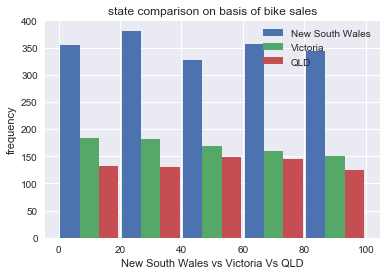

In [68]:
sns.set()
_=plt.hist([data2["past_3_years_bike_related_purchases"][data2["state"]=="New South Wales"],data2["past_3_years_bike_related_purchases"][data2["state"]=="Victoria"],data2["past_3_years_bike_related_purchases"][data2["state"]=="QLD"]],bins=[0,20,40,60,80,100],rwidth=0.95,label=["New South Wales","Victoria","QLD"])
plt.xlabel("New South Wales vs Victoria Vs QLD")
plt.ylabel("frequency")
plt.title("state comparison on basis of bike sales")
plt.legend()
plt.show()

In [69]:
data2.head()

,customer_id,gender,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,tenure,state,property_valuation
0,144,Male,71,42,IT,Mass Customer,No,11,New South Wales,3.0
1,168,Female,8,42,IT,Affluent Customer,Yes,11,Victoria,6.0
2,290,Male,42,42,IT,Mass Customer,No,11,New South Wales,9.0
3,451,Male,37,42,IT,High Net Worth,No,11,Victoria,10.0
4,453,Male,81,42,IT,High Net Worth,No,11,New South Wales,10.0


In [70]:
 '''Now we will column one by one
-customer_id is important but it does not tell us about the bike_related_purchases
-gender does not tell about the bike_realted shares
-age is important because the younger age people use more bikes
-job_industry_category is important
-wealth_segment is important("Mass customer")
-owns_car is important
-state is important
-tenure does not give much imforamtion and also related to age so to remove multicollinearity removining it.
-property_valuation is not important
'''

'Now we will column one by one\n-customer_id is important but it does not tell us about the bike_related_purchases\n-gender does not tell about the bike_realted shares\n-age is important because the younger age people use more bikes\n-job_industry_category is important\n-wealth_segment is important("Mass customer")\n-owns_car is important\n-state is important\n-tenure does not give much imforamtion and also related to age so to remove multicollinearity removining it.\n-property_valuation is not important\n'

In [71]:
data_analyzed=data2.drop(["gender","tenure","property_valuation"],axis=1)

In [72]:
#Feature Scaling
data_analyzed.columns

Index(['customer_id', 'past_3_years_bike_related_purchases', 'age',
       'job_industry_category', 'wealth_segment', 'owns_car', 'state'],
      dtype='object')

In [73]:
data_analyzed["job_industry_category"].unique()

array(['IT', 'Health', 'Financial Services', 'Manufacturing', 'Retail',
       'Agriculture', 'Telecommunications', 'Entertainment', 'Property'],
      dtype=object)

In [74]:
#FEATURE ENGINEERING
'''Feature Engineering is the act of extracting important features from raw data
and transforming them into formats that are suitable for machine learning models
. To do Feature Engineering, a data scientist must use domain knowledge 
(Knowledge about a specific field), math and programming skills to transform or 
come up with new features that will help a machine learning model perform 
better.'''

'Feature Engineering is the act of extracting important features from raw data\nand transforming them into formats that are suitable for machine learning models\n. To do Feature Engineering, a data scientist must use domain knowledge \n(Knowledge about a specific field), math and programming skills to transform or \ncome up with new features that will help a machine learning model perform \nbetter.'

In [75]:
#RFM analysis
df_transaction.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,17.87,41245,Kristos Anthony,Male
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,1702.55,41701,Lauree O'Donnell,Female
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,1544.61,36361,Berne Donegan,Male
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,817.36,36145,Titus Worsall,Male
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,1055.82,42226,Norma Batrim,Female


In [ ]:
#transaction is is unique id for each transaction
#product_id is id of each prodcut bought by customer

In [76]:
#first we would fing the recency on our RFM model
df_transaction.describe(include="all")

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender
count,19568.000000,19568.000000,19568.000000,19568,19216.000000,19568,19568,19568,19568,19568,19568.000000,19568.000000,19568.000000,19568.000000,19568,19568
unique,NaN,NaN,NaN,364,NaN,1,6,4,3,3,NaN,NaN,NaN,NaN,3482,2
top,NaN,NaN,NaN,2017-08-18 00:00:00,NaN,Approved,Solex,Standard,medium,medium,NaN,NaN,NaN,NaN,Corabelle,Female
freq,NaN,NaN,NaN,82,NaN,19568,4199,14010,13656,12837,NaN,NaN,NaN,NaN,17,9983
first,NaN,NaN,NaN,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2017-12-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,9999.835190,45.793029,1741.229252,NaN,0.500260,NaN,NaN,NaN,NaN,NaN,1107.197719,555.633944,551.563776,38202.958095,NaN,NaN
std,5775.584447,30.575419,1011.064456,NaN,0.500013,NaN,NaN,NaN,NaN,NaN,582.941399,405.826131,493.349873,2875.776024,NaN,NaN
min,1.000000,0.000000,1.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,12.010000,7.210000,4.800000,33259.000000,NaN,NaN
25%,4993.750000,18.000000,861.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,575.270000,215.140000,133.780000,35667.000000,NaN,NaN


In [78]:
#order_status has only one value approved so removing that column
df_transaction=df_transaction.drop(["order_status"],axis=1)

In [88]:
df_transaction.describe(include="all")

,transaction_id,product_id,customer_id,transaction_date,online_order,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender
count,19568.000000,19568.000000,19568.000000,19568,19216.000000,19568,19568,19568,19568,19568.000000,19568.000000,19568.000000,19568.000000,19568,19568
unique,NaN,NaN,NaN,364,NaN,6,4,3,3,NaN,NaN,NaN,NaN,3482,2
top,NaN,NaN,NaN,2017-08-18 00:00:00,NaN,Solex,Standard,medium,medium,NaN,NaN,NaN,NaN,Corabelle,Female
freq,NaN,NaN,NaN,82,NaN,4199,14010,13656,12837,NaN,NaN,NaN,NaN,17,9983
first,NaN,NaN,NaN,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2017-12-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,9999.835190,45.793029,1741.229252,NaN,0.500260,NaN,NaN,NaN,NaN,1107.197719,555.633944,551.563776,38202.958095,NaN,NaN
std,5775.584447,30.575419,1011.064456,NaN,0.500013,NaN,NaN,NaN,NaN,582.941399,405.826131,493.349873,2875.776024,NaN,NaN
min,1.000000,0.000000,1.000000,NaN,0.000000,NaN,NaN,NaN,NaN,12.010000,7.210000,4.800000,33259.000000,NaN,NaN
25%,4993.750000,18.000000,861.000000,NaN,0.000000,NaN,NaN,NaN,NaN,575.270000,215.140000,133.780000,35667.000000,NaN,NaN


In [93]:
df_transaction.isna().sum()

transaction_id             0
product_id                 0
customer_id                0
transaction_date           0
online_order               0
brand                      0
product_line               0
product_class              0
product_size               0
list_price                 0
standard_cost              0
profit                     0
product_first_sold_date    0
name                       0
gender                     0
dtype: int64

In [94]:
df_transaction.isnull().sum()

transaction_id             0
product_id                 0
customer_id                0
transaction_date           0
online_order               0
brand                      0
product_line               0
product_class              0
product_size               0
list_price                 0
standard_cost              0
profit                     0
product_first_sold_date    0
name                       0
gender                     0
dtype: int64

In [95]:
#there are some null values exists in this dataframe
df_transaction=df_transaction.dropna(axis=0)

In [96]:
df_transaction.describe(include="all")

,transaction_id,product_id,customer_id,transaction_date,online_order,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender
count,19216.000000,19216.000000,19216.000000,19216,19216.000000,19216,19216,19216,19216,19216.000000,19216.000000,19216.000000,19216.000000,19216,19216
unique,NaN,NaN,NaN,364,NaN,6,4,3,3,NaN,NaN,NaN,NaN,3479,2
top,NaN,NaN,NaN,2017-02-14 00:00:00,NaN,Solex,Standard,medium,medium,NaN,NaN,NaN,NaN,Corabelle,Female
freq,NaN,NaN,NaN,81,NaN,4116,13757,13422,12619,NaN,NaN,NaN,NaN,17,9812
first,NaN,NaN,NaN,2017-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2017-12-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,9995.374115,45.773002,1741.232254,NaN,0.500260,NaN,NaN,NaN,NaN,1106.502879,555.183937,551.318942,38205.664290,NaN,NaN
std,5778.619560,30.578836,1010.935608,NaN,0.500013,NaN,NaN,NaN,NaN,582.796428,405.404781,493.112017,2878.683865,NaN,NaN
min,1.000000,0.000000,1.000000,NaN,0.000000,NaN,NaN,NaN,NaN,12.010000,7.210000,4.800000,33259.000000,NaN,NaN
25%,4981.750000,18.000000,860.750000,NaN,0.000000,NaN,NaN,NaN,NaN,575.270000,215.140000,133.780000,35667.000000,NaN,NaN


In [79]:
Cust_brand=df_transaction[['brand','customer_id']].drop_duplicates()

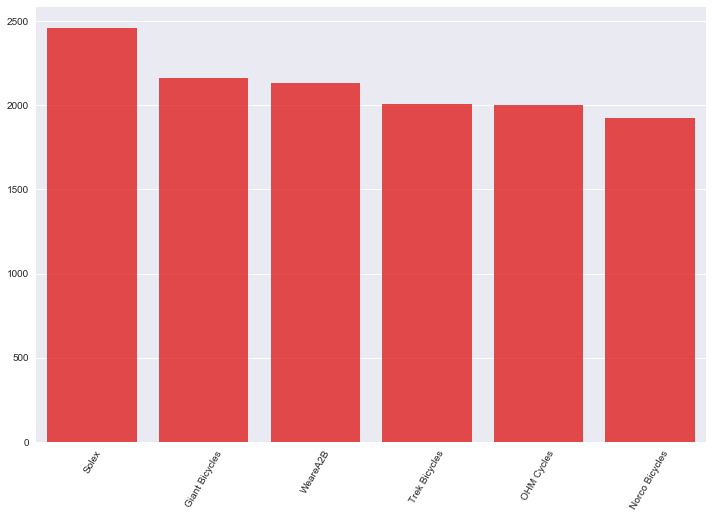

In [86]:
cust_brand_count=Cust_brand.groupby(['brand'])["customer_id"].aggregate("count").reset_index().sort_values(by="customer_id",ascending=False)
brand=list(cust_brand_count["brand"])
cust_id=list(cust_brand_count["customer_id"])
plt.figure(figsize=(12,8))
sns.barplot(brand, cust_id, alpha=0.8, color="red")
plt.xticks(rotation='60')
plt.show()
#So solex brand should be more focused 

In [112]:
def func(order):
    return str(bool(order))
    
df_transaction["online_order1"]=df_trasaction["online_order"].apply(func)

In [113]:
df_transaction.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender,online_order1
0,1,2,2950,2017-02-25,False,Solex,Standard,medium,medium,71.49,53.62,17.87,41245,Kristos Anthony,Male,False
1,2,3,3120,2017-05-21,True,Trek Bicycles,Standard,medium,large,2091.47,388.92,1702.55,41701,Lauree O'Donnell,Female,True
2,3,37,402,2017-10-16,False,OHM Cycles,Standard,low,medium,1793.43,248.82,1544.61,36361,Berne Donegan,Male,False
3,4,88,3135,2017-08-31,False,Norco Bicycles,Standard,medium,medium,1198.46,381.10,817.36,36145,Titus Worsall,Male,False
4,5,78,787,2017-10-01,True,Giant Bicycles,Standard,medium,large,1765.30,709.48,1055.82,42226,Norma Batrim,Female,True


In [114]:
Cust_order=df_transaction[['online_order1','customer_id']].drop_duplicates()


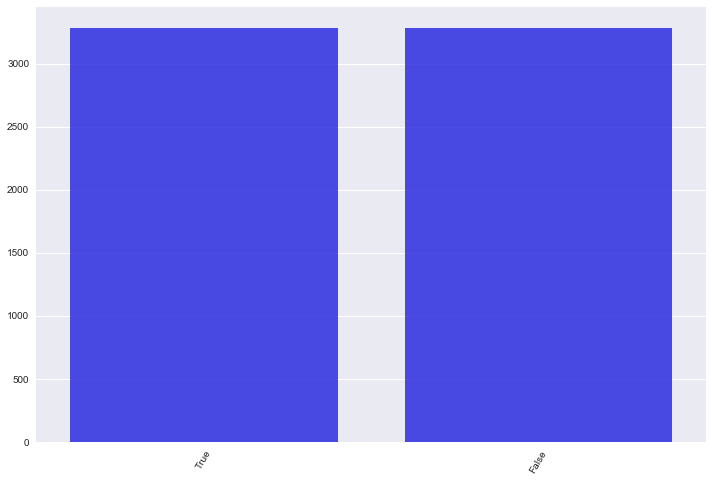

In [116]:
cust_order_count=Cust_order.groupby(['online_order1'])["customer_id"].aggregate("count").reset_index().sort_values(by="customer_id",ascending=False)
online_order=list(cust_order_count["online_order1"])
cust_id=list(cust_order_count["customer_id"])
plt.figure(figsize=(12,8))
sns.barplot(online_order, cust_id, alpha=0.8, color="blue")
plt.xticks(rotation='60')
plt.show()
#both are imp

In [119]:
Cust_line=df_transaction[['product_line','customer_id']].drop_duplicates()

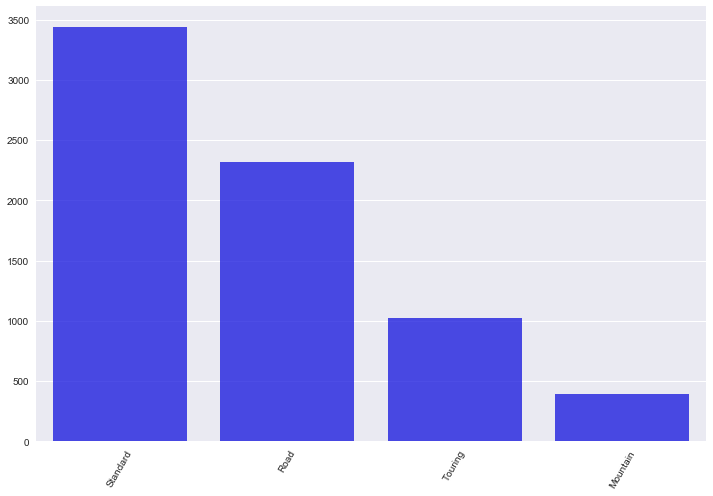

In [120]:
cust_line_count=Cust_line.groupby(['product_line'])["customer_id"].aggregate("count").reset_index().sort_values(by="customer_id",ascending=False)
product_line=list(cust_line_count["product_line"])
cust_id=list(cust_line_count["customer_id"])
plt.figure(figsize=(12,8))
sns.barplot(product_line, cust_id, alpha=0.8, color="blue")
plt.xticks(rotation='60')
plt.show()
#standard bikes are more sold

In [121]:
Cust_class=df_transaction[['product_class','customer_id']].drop_duplicates()

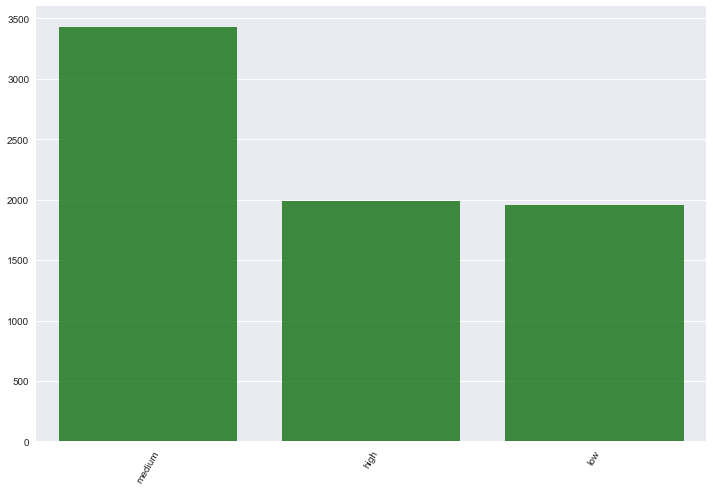

In [123]:
cust_class_count=Cust_class.groupby(['product_class'])["customer_id"].aggregate("count").reset_index().sort_values(by="customer_id",ascending=False)
product_class=list(cust_class_count["product_class"])
cust_id=list(cust_class_count["customer_id"])
plt.figure(figsize=(12,8))
sns.barplot(product_class, cust_id, alpha=0.8, color="green")
plt.xticks(rotation='60')
plt.show()
#medium classes should be more focused on

In [124]:
df_transaction.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender,online_order1
0,1,2,2950,2017-02-25,False,Solex,Standard,medium,medium,71.49,53.62,17.87,41245,Kristos Anthony,Male,False
1,2,3,3120,2017-05-21,True,Trek Bicycles,Standard,medium,large,2091.47,388.92,1702.55,41701,Lauree O'Donnell,Female,True
2,3,37,402,2017-10-16,False,OHM Cycles,Standard,low,medium,1793.43,248.82,1544.61,36361,Berne Donegan,Male,False
3,4,88,3135,2017-08-31,False,Norco Bicycles,Standard,medium,medium,1198.46,381.10,817.36,36145,Titus Worsall,Male,False
4,5,78,787,2017-10-01,True,Giant Bicycles,Standard,medium,large,1765.30,709.48,1055.82,42226,Norma Batrim,Female,True


In [127]:
#Calculating recency
df_transaction["transaction_date"].min(),df_transaction["transaction_date"].max()

(Timestamp('2017-01-01 00:00:00'), Timestamp('2017-12-30 00:00:00'))

In [158]:
from datetime import datetime
def rec(date):
    month=date.strftime("%m")
   
    if(month>="10"):
        return(5)
    elif(month>="08" and month<"10"):
        return(4)
    elif(month>="06" and month<"08"):
        return(3)
    elif(month>="04" and month<"06"):
        return(2)
    else:
        return(1)
df_transaction["recency"]=df_transaction["transaction_date"].apply(rec)

In [159]:
df_transaction.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,brand,product_line,product_class,product_size,list_price,standard_cost,profit,product_first_sold_date,name,gender,online_order1,recency
0,1,2,2950,2017-02-25,False,Solex,Standard,medium,medium,71.49,53.62,17.87,41245,Kristos Anthony,Male,False,1
1,2,3,3120,2017-05-21,True,Trek Bicycles,Standard,medium,large,2091.47,388.92,1702.55,41701,Lauree O'Donnell,Female,True,2
2,3,37,402,2017-10-16,False,OHM Cycles,Standard,low,medium,1793.43,248.82,1544.61,36361,Berne Donegan,Male,False,5
3,4,88,3135,2017-08-31,False,Norco Bicycles,Standard,medium,medium,1198.46,381.10,817.36,36145,Titus Worsall,Male,False,4
4,5,78,787,2017-10-01,True,Giant Bicycles,Standard,medium,large,1765.30,709.48,1055.82,42226,Norma Batrim,Female,True,5


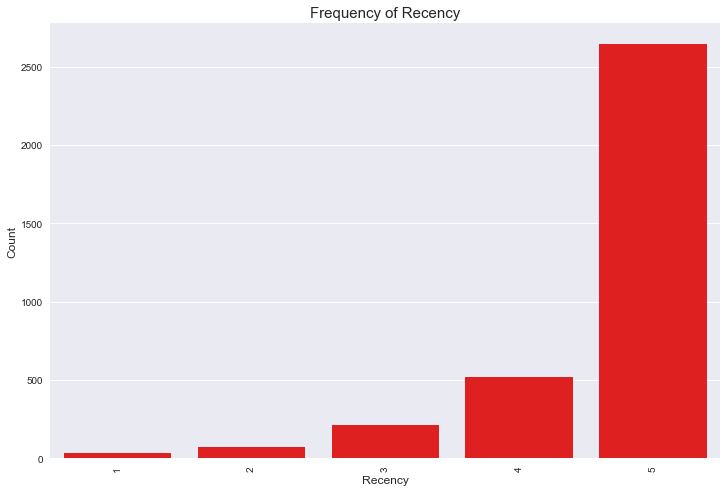

In [160]:
cust_date=df_transaction.groupby("customer_id",as_index=False)["recency"].max()
plt.figure(figsize=(12,8))
sns.countplot(x='recency', data=cust_date, color="red")
plt.ylabel('Count', fontsize=12)
plt.xlabel('Recency', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of Recency', fontsize=15)
plt.show()

In [163]:
#calculating frequency
Cust_freq=df_transaction[["customer_id","transaction_id"]].drop_duplicates()

In [171]:
cust_freq_count=Cust_freq.groupby(["customer_id"])["transaction_id"].aggregate("count").reset_index().sort_values(by="transaction_id",ascending=False)
cust_freq_count["frequency_band"]=pd.qcut(cust_freq_count["transaction_id"],5)
unique_transaction=cust_freq_count[['frequency_band']].drop_duplicates()

unique_transaction

,frequency_band
2170,"(7.0, 14.0]"
1242,"(6.0, 7.0]"
1561,"(5.0, 6.0]"
2392,"(4.0, 5.0]"
265,"(0.999, 4.0]"


In [194]:
def f(row):
    if(row["transaction_id"]<=4):
        val = 1
    elif(row["transaction_id"]>4 and row["transaction_id"]<=5):
        val = 2
    elif(row["transaction_id"]>5 and row["transaction_id"]<=6):
        val = 3
    elif(row["transaction_id"]>6 and row["transaction_id"]<=7):
        val = 4
    else:
        val = 5
    return val

In [195]:
cust_freq_count["frequency"] = cust_freq_count.apply(f, axis=1)
cust_freq_count.head(200)

,customer_id,transaction_id,frequency_band,frequency
2170,2183,14,"(7.0, 14.0]",5
2462,2476,14,"(7.0, 14.0]",5
1058,1068,14,"(7.0, 14.0]",5
1934,1946,13,"(7.0, 14.0]",5
3214,3232,13,"(7.0, 14.0]",5
2060,2072,13,"(7.0, 14.0]",5
632,637,13,"(7.0, 14.0]",5
3307,3326,13,"(7.0, 14.0]",5
2450,2464,13,"(7.0, 14.0]",5
2896,2912,13,"(7.0, 14.0]",5


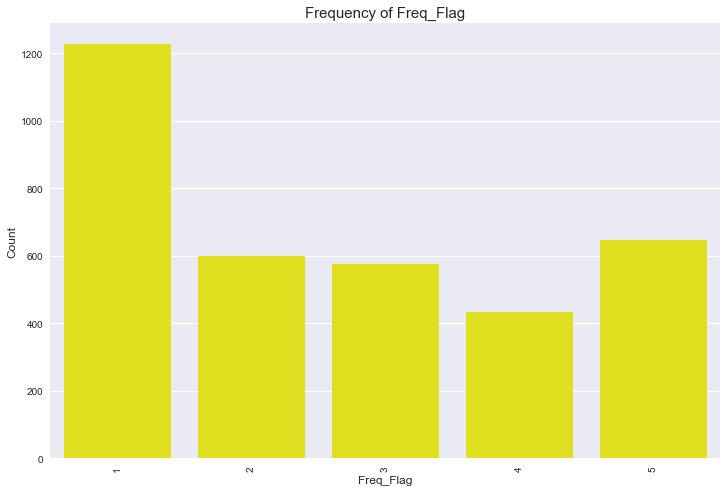

In [196]:

plt.figure(figsize=(12,8))
sns.countplot(x="frequency", data=cust_freq_count, color="yellow")
plt.ylabel('Count', fontsize=12)
plt.xlabel('Freq_Flag', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of Freq_Flag', fontsize=15)
plt.show()

In [211]:
#calculating monetary
Cust_monetary = df_transaction.groupby(['customer_id'])["profit"].aggregate("sum").reset_index().sort_values(by="profit", ascending=False)
Cust_monetary

,customer_id,profit
932,941,11668.95
2623,2637,11222.65
1449,1460,10787.60
1547,1558,10640.30
3307,3326,10422.04
318,322,10336.77
2755,2770,10028.80
193,195,9633.41
359,363,9458.17
1471,1482,9269.16


In [212]:
Cust_monetary['monetary_Band'] = pd.qcut(Cust_monetary["profit"], 5)
Cust_monetary1=Cust_monetary[['monetary_Band']].drop_duplicates()
Cust_monetary1

,monetary_Band
932,"(4473.87, 11668.95]"
897,"(3269.2, 4473.87]"
242,"(2395.71, 3269.2]"
1728,"(1544.81, 2395.71]"
1213,"(15.079, 1544.81]"


In [213]:
Cust_monetary.head()

,customer_id,profit,monetary_Band
932,941,11668.95,"(4473.87, 11668.95]"
2623,2637,11222.65,"(4473.87, 11668.95]"
1449,1460,10787.60,"(4473.87, 11668.95]"
1547,1558,10640.30,"(4473.87, 11668.95]"
3307,3326,10422.04,"(4473.87, 11668.95]"


In [214]:
def f(row):
    if(row["profit"] <= 1544.81):
        val = 1
    elif row["profit"] > 1544.81 and row["profit"] <= 2395.71:
        val = 2
    elif row["profit"] >  2395.71 and row["profit"] <= 3269.2:
        val = 3
    elif row["profit"] >3269.2 and row["profit"] <=4473.87:
        val = 4
    else:
        val = 5
    return val

In [217]:
Cust_monetary["monetary"]=Cust_monetary.apply(f,axis=1)
Cust_monetary

,customer_id,profit,monetary_Band,monetary
932,941,11668.95,"(4473.87, 11668.95]",5
2623,2637,11222.65,"(4473.87, 11668.95]",5
1449,1460,10787.60,"(4473.87, 11668.95]",5
1547,1558,10640.30,"(4473.87, 11668.95]",5
3307,3326,10422.04,"(4473.87, 11668.95]",5
318,322,10336.77,"(4473.87, 11668.95]",5
2755,2770,10028.80,"(4473.87, 11668.95]",5
193,195,9633.41,"(4473.87, 11668.95]",5
359,363,9458.17,"(4473.87, 11668.95]",5
1471,1482,9269.16,"(4473.87, 11668.95]",5


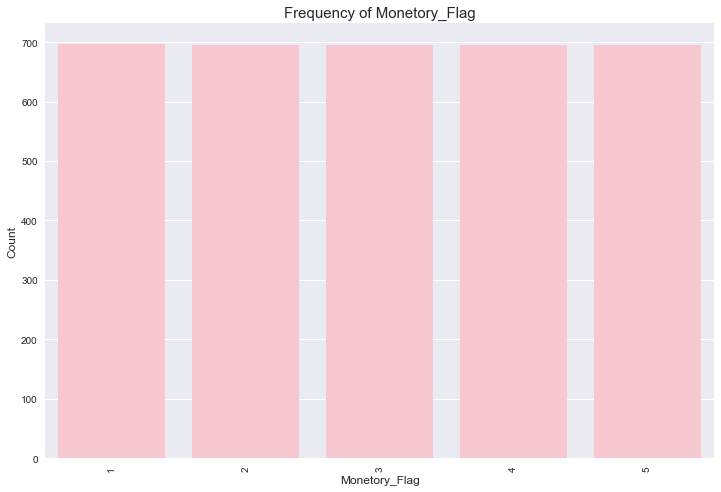

In [220]:
plt.figure(figsize=(12,8))
sns.countplot(x="monetary", data=Cust_monetary, color="pink")
plt.ylabel('Count', fontsize=12)
plt.xlabel('Monetory_Flag', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of Monetory_Flag', fontsize=15)
plt.show()


In [224]:
#Combining all
Cust_UK_All=pd.merge(cust_date,cust_freq_count[["customer_id","frequency"]],on=['customer_id'],how='left')
Cust_UK_All=pd.merge(Cust_UK_All,Cust_monetary[["customer_id","monetary"]],on=["customer_id"],how='left')
Cust_UK_All.head(100)

,customer_id,recency,frequency,monetary
0,1,5,5,3
1,2,4,1,2
2,3,4,4,4
3,4,3,1,1
4,5,5,3,2
5,6,5,2,4
6,7,2,1,1
7,8,5,5,5
8,9,5,3,2
9,10,5,2,4


In [231]:
loyal_customer=(Cust_UK_All[Cust_UK_All["frequency"]==5][Cust_UK_All["recency"]==5][Cust_UK_All["monetary"]==5])
loyal_customer.count()

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


customer_id    360
recency        360
frequency      360
monetary       360
dtype: int64

In [245]:
def RFM(row):
    r=row["recency"]
    f=row["frequency"]
    m=row["monetary"]
    if(r>=4 and f>=4 and m>=4):
        value="loyal customers"
    elif(r>=4 and m>3 and f>2):
        value="new customers"
    elif(r<=3 and m>=3 and f>=3):
        value="slipping away"
    elif(r<3 and m<3 and f<3):
        value="lost"
    else:
        value="normal"
    return value

In [246]:
Cust_UK_All["customers types"]=Cust_UK_All.apply(RFM,axis=1)

In [247]:
Cust_UK_All.head(100)

,customer_id,recency,frequency,monetary,customers types
0,1,5,5,3,normal
1,2,4,1,2,normal
2,3,4,4,4,loyal customers
3,4,3,1,1,normal
4,5,5,3,2,normal
5,6,5,2,4,normal
6,7,2,1,1,lost
7,8,5,5,5,loyal customers
8,9,5,3,2,normal
9,10,5,2,4,normal


In [278]:
Cust_UK_All["total"]=Cust_UK_All["recency"]+Cust_UK_All["frequency"]+Cust_UK_All["monetary"]
result=Cust_UK_All.sort_values(by="total",ascending=False)
final=result["customer_id"][:2000]
final=final.reset_index(drop=True).to_frame()
final

,customer_id
0,1068
1,1003
2,2914
3,2912
4,973
5,987
6,999
7,1000
8,2894
9,1006


In [271]:
df_newCustomer = pd.read_excel('updated.xlsx','NewCustomerList')

In [272]:
df_newCustomer.head()

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,...,QLD,Australia,6,0.80,1.0000,1.2500,1.062500,1,1,1.718750
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,...,NSW,Australia,11,0.73,0.7300,0.9125,0.775625,1,1,1.718750
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,...,VIC,Australia,5,0.77,0.7700,0.7700,0.770000,1,1,1.718750
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,...,QLD,Australia,1,0.49,0.6125,0.6125,0.612500,4,4,1.703125
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,...,NSW,Australia,9,0.67,0.6700,0.8375,0.837500,4,4,1.703125


In [273]:
df_newCustomer.describe()

,past_3_years_bike_related_purchases,tenure,postcode,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,49.836000,11.388000,3019.227000,7.397000,0.737830,0.827622,0.930036,0.858792,498.749000,498.819000,0.881714
std,27.796686,5.037145,848.895767,2.758804,0.197591,0.236924,0.281570,0.268674,288.800127,288.810997,0.293525
min,0.000000,0.000000,2000.000000,1.000000,0.400000,0.400000,0.400000,0.357000,1.000000,1.000000,0.340000
25%,26.750000,7.000000,2209.000000,6.000000,0.560000,0.630000,0.710000,0.650781,250.000000,250.000000,0.649531
50%,51.000000,11.000000,2800.000000,8.000000,0.740000,0.825000,0.912500,0.839375,500.000000,500.000000,0.860000
75%,72.000000,15.000000,3845.500000,9.000000,0.900000,1.000000,1.125000,1.051875,750.250000,750.250000,1.075000
max,99.000000,22.000000,4879.000000,12.000000,1.100000,1.375000,1.718750,1.718750,1000.000000,1000.000000,1.718750


In [279]:
top_cust=pd.merge(final,data_analyzed,on=['customer_id'],how='left')

In [281]:
top_cust.head(1000)

,customer_id,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,state
0,1068,5.0,25.0,Health,Mass Customer,Yes,New South Wales
1,1003,35.0,52.0,Financial Services,High Net Worth,No,QLD
2,2914,76.0,37.0,Health,Affluent Customer,Yes,New South Wales
3,2912,NaN,NaN,NaN,NaN,NaN,NaN
4,973,46.0,40.0,Health,High Net Worth,No,Victoria
5,987,89.0,45.0,Financial Services,Affluent Customer,Yes,QLD
6,999,NaN,NaN,NaN,NaN,NaN,NaN
7,1000,44.0,41.0,Financial Services,Mass Customer,No,Victoria
8,2894,91.0,43.0,Financial Services,Mass Customer,Yes,QLD
9,1006,15.0,42.0,Telecommunications,Affluent Customer,Yes,Victoria


In [282]:
top_cust.isna().sum()

customer_id                              0
past_3_years_bike_related_purchases    349
age                                    349
job_industry_category                  349
wealth_segment                         349
owns_car                               349
state                                  349
dtype: int64

In [283]:
top_cust=top_cust.dropna()

In [284]:
top_cust.describe(include='all')

,customer_id,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,state
count,1651.000000,1651.000000,1651.000000,1651,1651,1651,1651
unique,NaN,NaN,NaN,9,3,2,3
top,NaN,NaN,NaN,Manufacturing,Mass Customer,Yes,New South Wales
freq,NaN,NaN,NaN,399,830,838,878
mean,1734.466990,48.471230,41.644458,NaN,NaN,NaN,NaN
std,1017.132904,28.523052,12.225267,NaN,NaN,NaN,NaN
min,6.000000,0.000000,18.000000,NaN,NaN,NaN,NaN
25%,829.500000,24.000000,32.500000,NaN,NaN,NaN,NaN
50%,1729.000000,47.000000,42.000000,NaN,NaN,NaN,NaN
75%,2622.500000,73.000000,51.000000,NaN,NaN,NaN,NaN


In [286]:
top_cust.head(500)

,customer_id,past_3_years_bike_related_purchases,age,job_industry_category,wealth_segment,owns_car,state
0,1068,5.0,25.0,Health,Mass Customer,Yes,New South Wales
1,1003,35.0,52.0,Financial Services,High Net Worth,No,QLD
2,2914,76.0,37.0,Health,Affluent Customer,Yes,New South Wales
4,973,46.0,40.0,Health,High Net Worth,No,Victoria
5,987,89.0,45.0,Financial Services,Affluent Customer,Yes,QLD
7,1000,44.0,41.0,Financial Services,Mass Customer,No,Victoria
8,2894,91.0,43.0,Financial Services,Mass Customer,Yes,QLD
9,1006,15.0,42.0,Telecommunications,Affluent Customer,Yes,Victoria
11,2887,42.0,46.0,Financial Services,High Net Worth,Yes,New South Wales
12,1021,16.0,42.0,Retail,High Net Worth,No,New South Wales


Text(0.5,1,'Frequency of job_industry_category')

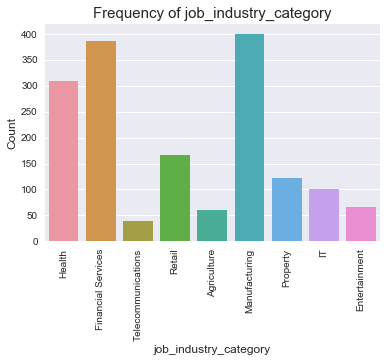

In [289]:
top_cust["job_industry_category"].value_counts()
sns.countplot(x="job_industry_category",data=top_cust)
plt.ylabel('Count', fontsize=12)
plt.xlabel('job_industry_category', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of job_industry_category', fontsize=15)
#manufacturing is most important

Text(0.5,1,'Frequency of state')

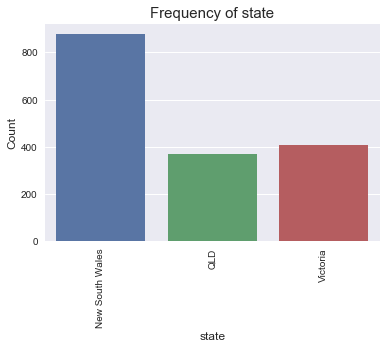

In [290]:
sns.countplot(x="state",data=top_cust)
plt.ylabel('Count', fontsize=12)
plt.xlabel('state', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of state', fontsize=15)
#Newsouthwales customers is most important

Text(0.5,1,'Frequency of owns_car')

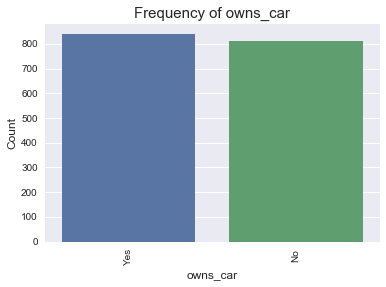

In [291]:
sns.countplot(x="owns_car",data=top_cust)
plt.ylabel('Count', fontsize=12)
plt.xlabel('owns_car', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of owns_car', fontsize=15)
#this does not give much information

Text(0.5,1,'Frequency of wealth_segment')

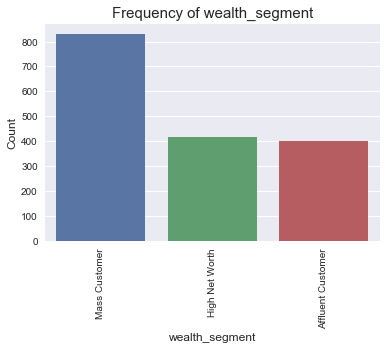

In [293]:
sns.countplot(x="wealth_segment",data=top_cust)
plt.ylabel('Count', fontsize=12)
plt.xlabel('wealth_segment', fontsize=12)
plt.xticks(rotation='vertical')
plt.title('Frequency of wealth_segment', fontsize=15)
#Mass customers should be more focused

No handles with labels found to put in legend.


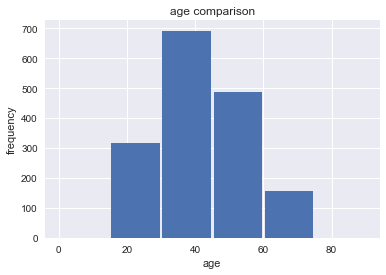

In [296]:
sns.set()
_=plt.hist(top_cust["age"],bins=[0,15,30,45,60,75,90],rwidth=0.95)
plt.xlabel("age")
plt.ylabel("frequency")
plt.title("age comparison")
plt.legend()
plt.show()
#age group between 30 to 50 should be more focused

In [297]:
df_newCustomer.head(50)

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
0,Chickie,Brister,Male,86,1957-07-12,General Manager,Manufacturing,Mass Customer,N,Yes,...,QLD,Australia,6,0.80,1.0000,1.250000,1.062500,1,1,1.718750
1,Morly,Genery,Male,69,1970-03-22,Structural Engineer,Property,Mass Customer,N,No,...,NSW,Australia,11,0.73,0.7300,0.912500,0.775625,1,1,1.718750
2,Ardelis,Forrester,Female,10,1974-08-28,Senior Cost Accountant,Financial Services,Affluent Customer,N,No,...,VIC,Australia,5,0.77,0.7700,0.770000,0.770000,1,1,1.718750
3,Lucine,Stutt,Female,64,1979-01-28,Account Representative III,Manufacturing,Affluent Customer,N,Yes,...,QLD,Australia,1,0.49,0.6125,0.612500,0.612500,4,4,1.703125
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,...,NSW,Australia,9,0.67,0.6700,0.837500,0.837500,4,4,1.703125
5,Druci,Brandli,Female,39,1951-04-29,Assistant Media Planner,Entertainment,High Net Worth,N,Yes,...,QLD,Australia,7,0.60,0.7500,0.750000,0.750000,6,6,1.671875
6,Rutledge,Hallt,Male,23,1976-10-06,Compensation Analyst,Financial Services,Mass Customer,N,No,...,NSW,Australia,7,0.49,0.4900,0.490000,0.416500,6,6,1.671875
7,Nancie,Vian,Female,74,1972-12-27,Human Resources Assistant II,Retail,Mass Customer,N,Yes,...,QLD,Australia,5,0.91,1.1375,1.137500,0.966875,8,8,1.656250
8,Duff,Karlowicz,Male,50,1972-04-28,Speech Pathologist,Manufacturing,Mass Customer,N,Yes,...,NSW,Australia,10,0.53,0.6625,0.828125,0.703906,8,8,1.656250
9,Barthel,Docket,Male,72,1985-08-02,Accounting Assistant IV,IT,Mass Customer,N,Yes,...,QLD,Australia,5,1.02,1.2750,1.275000,1.083750,10,10,1.640625


In [304]:
array=["Manufacturing","Financial Services"]
array1=["Mass Customer","Affluent Customer"]
result1=df_newCustomer[df_newCustomer["job_industry_category"].isin(array)][df_newCustomer["wealth_segment"].isin(array1)][df_newCustomer["state"]=="NSW"]

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [305]:
result1

,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,...,state,country,property_valuation,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Rank,Value
4,Melinda,Hadlee,Female,34,1965-09-21,Financial Analyst,Financial Services,Affluent Customer,N,No,...,NSW,Australia,9,0.67,0.6700,0.837500,0.837500,4,4,1.703125
6,Rutledge,Hallt,Male,23,1976-10-06,Compensation Analyst,Financial Services,Mass Customer,N,No,...,NSW,Australia,7,0.49,0.4900,0.490000,0.416500,6,6,1.671875
8,Duff,Karlowicz,Male,50,1972-04-28,Speech Pathologist,Manufacturing,Mass Customer,N,Yes,...,NSW,Australia,10,0.53,0.6625,0.828125,0.703906,8,8,1.656250
15,Dukie,Swire,Male,88,1954-03-31,NaN,Manufacturing,Affluent Customer,N,Yes,...,NSW,Australia,8,1.08,1.3500,1.687500,1.687500,16,16,1.562500
18,Odilia,Quick,Female,65,1938-11-09,General Manager,Manufacturing,Affluent Customer,N,Yes,...,NSW,Australia,11,0.70,0.8750,1.093750,1.093750,19,19,1.531250
20,Teddie,Burchill,Male,11,1968-12-21,Programmer I,Manufacturing,Mass Customer,N,Yes,...,NSW,Australia,9,0.50,0.6250,0.781250,0.664062,21,21,1.515625
21,Gaston,Dallaghan,Male,44,1993-09-29,Financial Analyst,Financial Services,Mass Customer,N,Yes,...,NSW,Australia,7,1.03,1.2875,1.287500,1.094375,21,21,1.515625
32,Sybilla,MacCart,Female,88,1987-01-15,Paralegal,Financial Services,Mass Customer,N,Yes,...,NSW,Australia,7,0.47,0.5875,0.734375,0.624219,32,32,1.453125
39,Antonin,Britt,Male,64,1993-08-28,NaN,Manufacturing,Affluent Customer,N,Yes,...,NSW,Australia,9,0.77,0.9625,1.203125,1.203125,40,40,1.434375
55,Martelle,Tuppeny,Female,52,1981-02-03,Marketing Assistant,Manufacturing,Mass Customer,N,No,...,NSW,Australia,10,1.09,1.0900,1.362500,1.158125,54,54,1.381250
